In [1]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from skimage import transform
from scipy import fftpack
from scipy.signal import fftconvolve
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
RANDOM_SEED = 43
np.random.seed(RANDOM_SEED)

In [2]:
# Load the data
df = pd.read_json('./data/train.json')
print len(df)
df

1604


,band_1,band_2,id,inc_angle,is_iceberg
0,"[-27.878361, -27.15416, -28.668615, -29.537971...","[-27.154118, -29.537888, -31.0306, -32.190483,...",dfd5f913,43.9239,0
1,"[-12.242375, -14.920305, -14.920363, -12.66633...","[-31.506321, -27.984554, -26.645678, -23.76760...",e25388fd,38.1562,0
2,"[-24.603676, -24.603714, -24.871029, -23.15277...","[-24.870956, -24.092632, -20.653963, -19.41104...",58b2aaa0,45.2859,1
3,"[-22.454607, -23.082819, -23.998013, -23.99805...","[-27.889421, -27.519794, -27.165262, -29.10350...",4cfc3a18,43.8306,0
4,"[-26.006956, -23.164886, -23.164886, -26.89116...","[-27.206915, -30.259186, -30.259186, -23.16495...",271f93f4,35.6256,0
5,"[-20.769371, -20.769434, -25.906025, -25.90602...","[-29.288746, -29.712593, -28.884804, -28.88480...",b51d18b5,36.9034,1
6,"[-26.673811, -23.666162, -27.622442, -28.31768...","[-24.557735, -26.97868, -27.622442, -29.073456...",31da1a04,34.4751,1
7,"[-24.989119, -27.755224, -25.817074, -24.98927...","[-27.755173, -26.732174, -28.124943, -31.83772...",56929c16,41.1769,0
8,"[-17.146641, -17.146572, -17.994583, -19.44553...","[-25.733608, -24.472507, -24.710424, -22.77215...",525ab75c,35.7829,0
9,"[-24.020853, -23.551275, -27.18819, -29.126434...","[-28.702518, -33.563324, -29.571918, -29.12643...",192f56eb,43.3007,0


# Visualize the Images

## Iceberg

In [3]:
def normalize(im):
    im = im - np.mean(im)
    im = im / np.std(im)
    return im

def get_convolve(im1, im2):
    im1 = im1 - np.mean(im1)
    im2 = im2 - np.mean(im2)
    im_conv = fftconvolve(im1, im2[::-1, ::-1], mode='same')
    return normalize(im_conv)

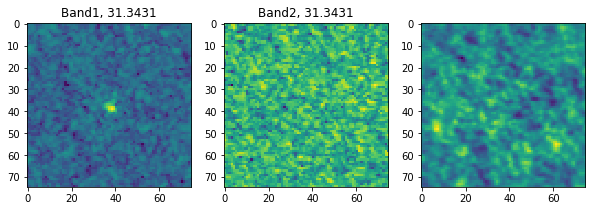

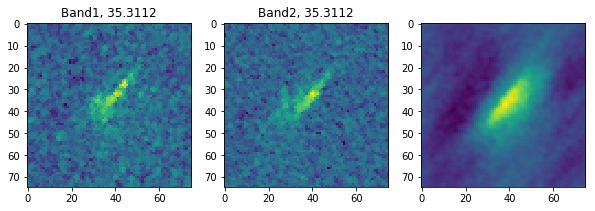

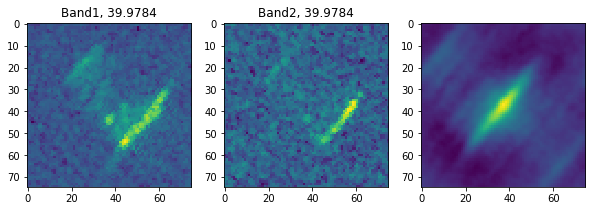

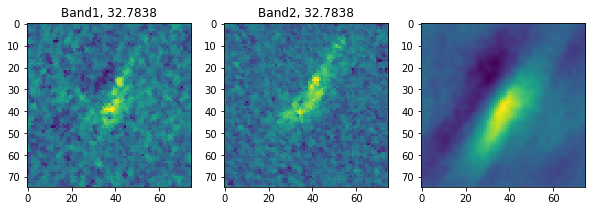

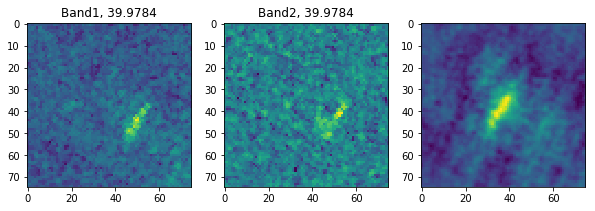

...

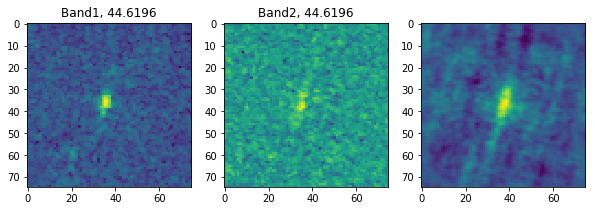

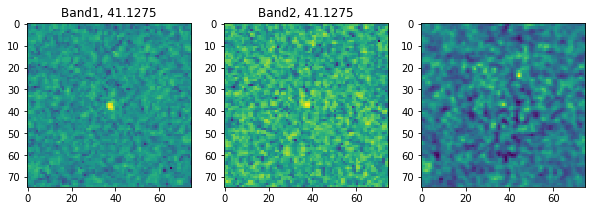

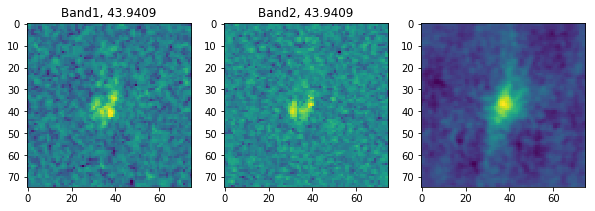

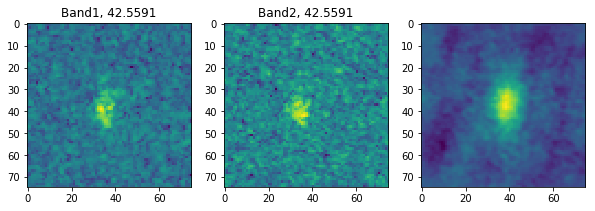

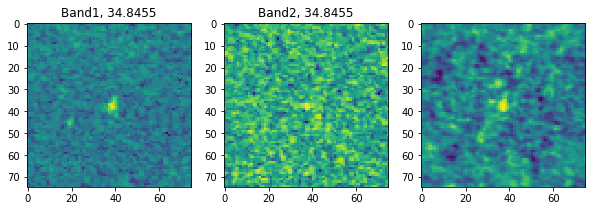

In [4]:
df_ = df[df['is_iceberg'] == 1].sample(20, random_state=RANDOM_SEED)
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
#     plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);
    plt.subplot(1,3,3); plt.imshow(get_convolve(im_band1, im_band2));

## Ship

/home/can/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


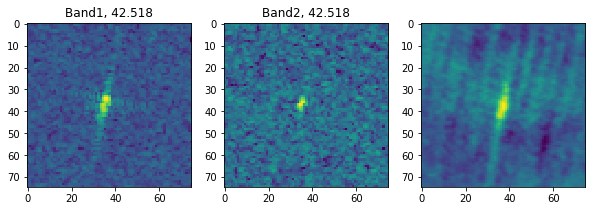

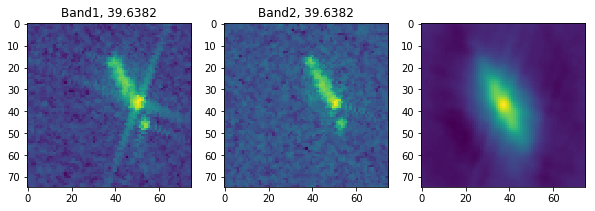

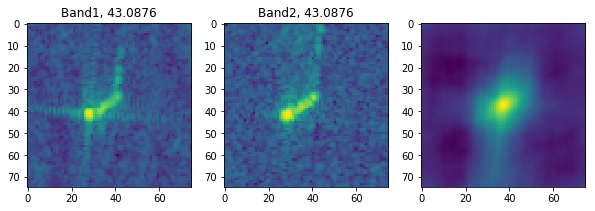

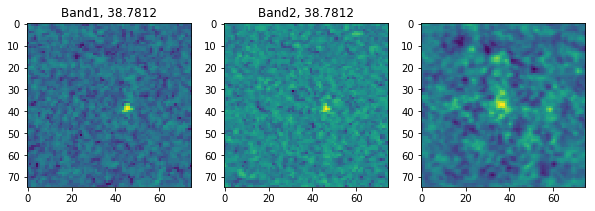

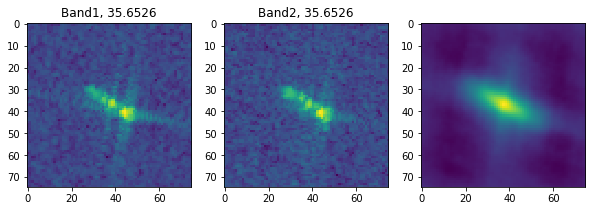

...

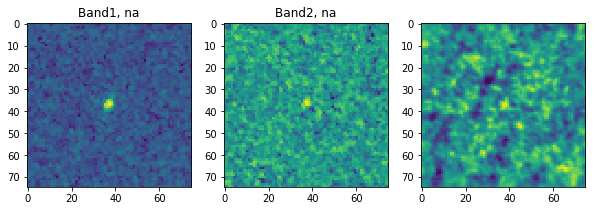

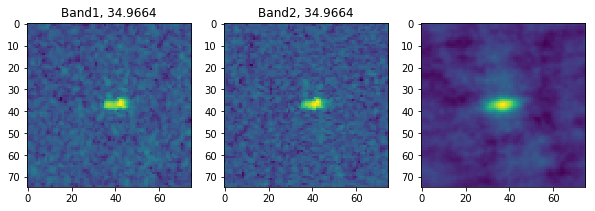

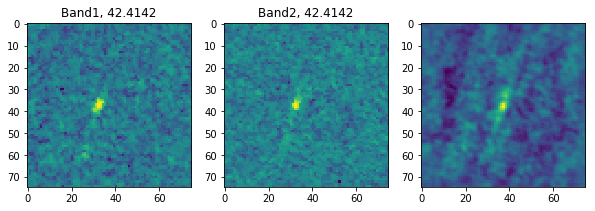

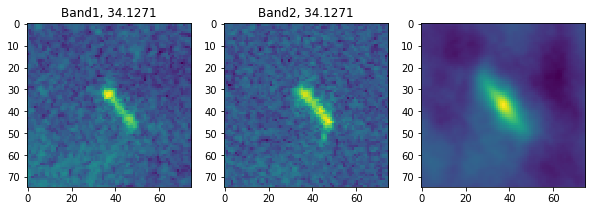

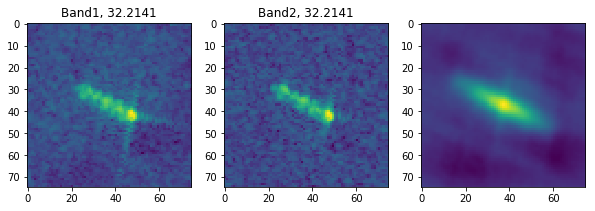

In [5]:
df_ = df[df['is_iceberg'] == 0].sample(50, random_state=RANDOM_SEED)
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
#     plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);
    plt.subplot(1,3,3); plt.imshow(get_convolve(im_band1, im_band2));

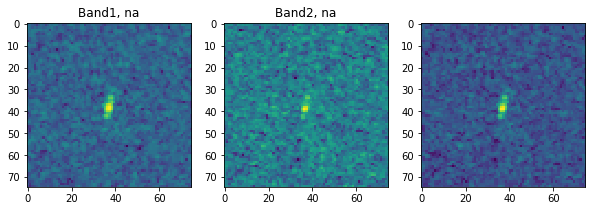

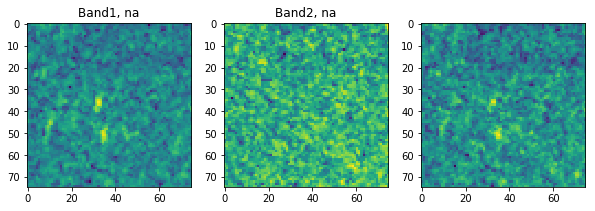

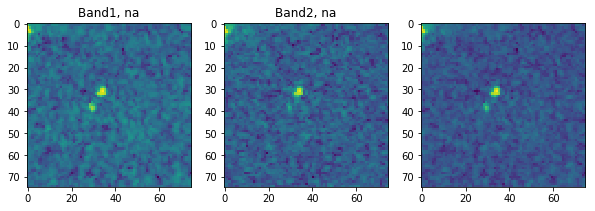

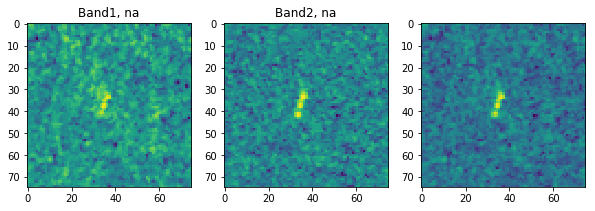

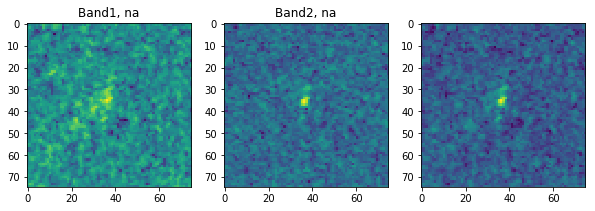

...

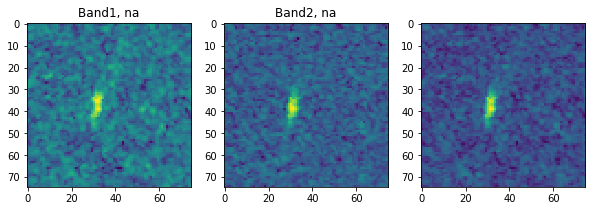

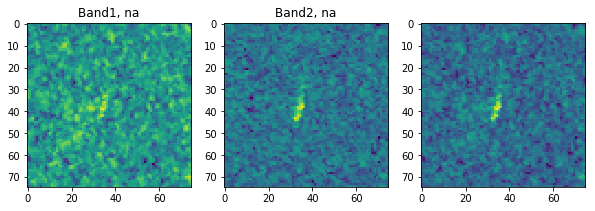

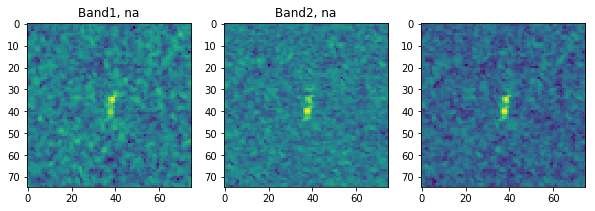

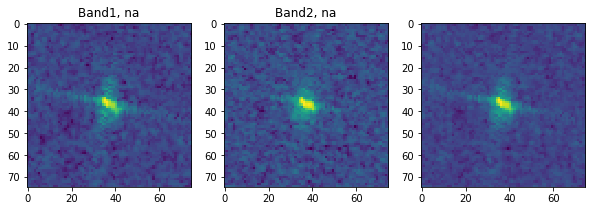

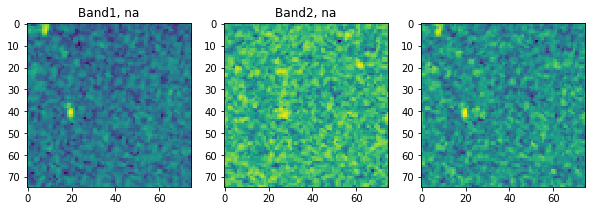

In [6]:
df_ = df[(df['is_iceberg'] == 0) & (df['inc_angle'] == 'na')].sample(50, random_state=RANDOM_SEED)
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
    plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);

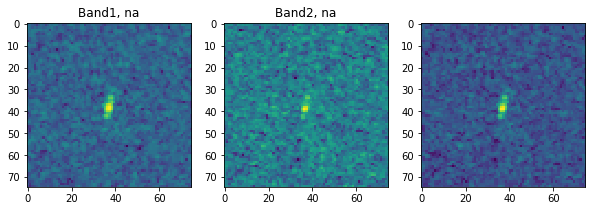

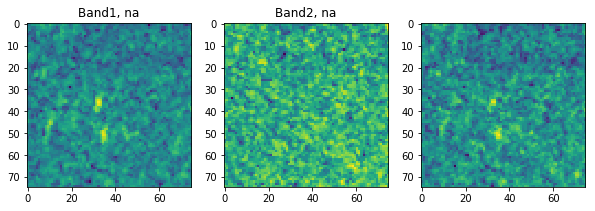

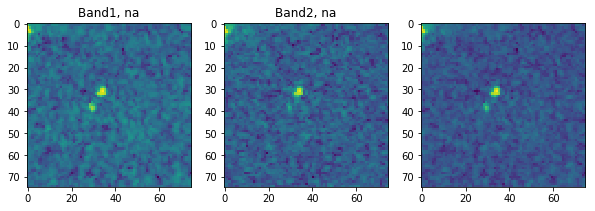

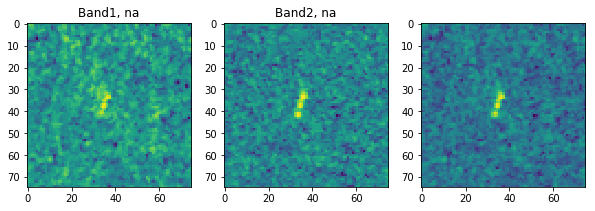

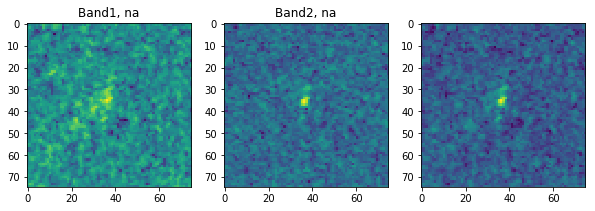

...

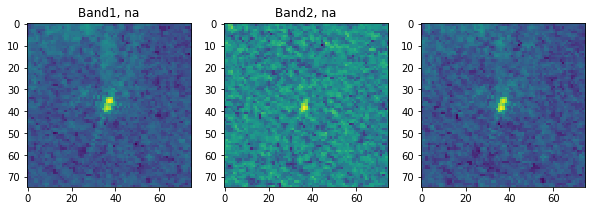

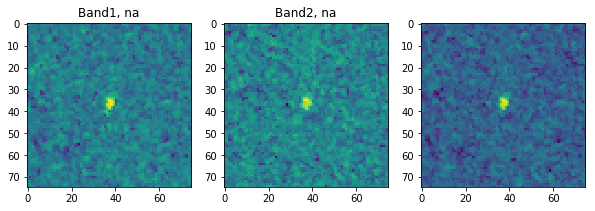

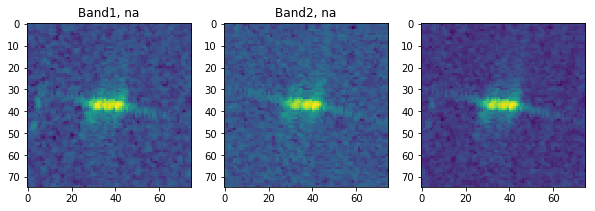

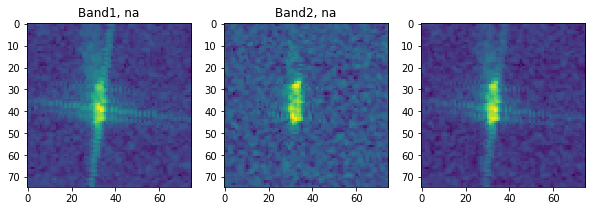

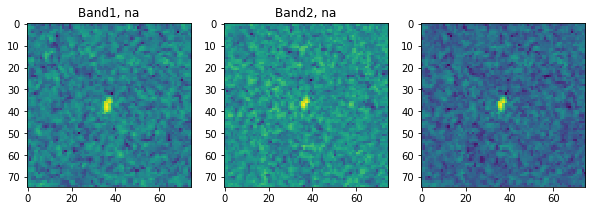

In [6]:
df_ = df[(df['is_iceberg'] == 0) & (df['inc_angle'] == 'na')].sample(20, random_state=RANDOM_SEED)
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
    plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);

# Rotation

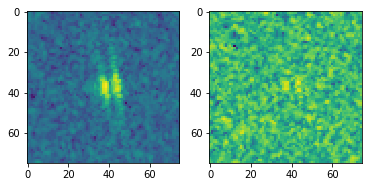

In [7]:
# Load the images and plot
df_ = df[df['is_iceberg'] == 0].sample(1, random_state=12)
im_band1 = np.array(df_['band_1'].iloc[0]).reshape(75, 75)
im_band2 = np.array(df_['band_2'].iloc[0]).reshape(75, 75)
#
fig = plt.figure()
plt.subplot(1,2,1); plt.imshow(im_band1)
plt.subplot(1,2,2); plt.imshow(im_band2)

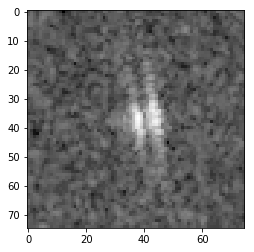

In [8]:
im_band1 -= np.mean(im_band1)
im_band1 /= np.std(im_band1)
im_band1_rot = transform.rotate(im_band1[:, :], angle=0, mode='reflect')
plt.imshow(im_band1_rot, cmap='gray')

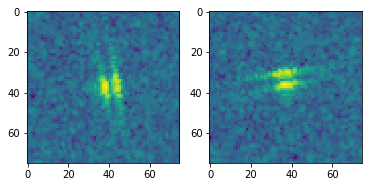

In [9]:
def h_flip(im):
    return im[:, ::-1]

def v_flip(im):
    return im[::-1, :]

def hv_flip(im):
    return im[::-1, ::-1]

def rot90(im):
    return transform.rotate(im, angle=90, mode='reflect')

def rot180(im):
    return transform.rotate(im, angle=180, mode='reflect')

def rot270(im):
    return transform.rotate(im, angle=270, mode='reflect')

im_ = im_band1
im_ = rot270(im_)
im_ = hv_flip(im_)


fig = plt.figure()
plt.subplot(1,2,1); plt.imshow(im_band1)
plt.subplot(1,2,2); plt.imshow(im_)

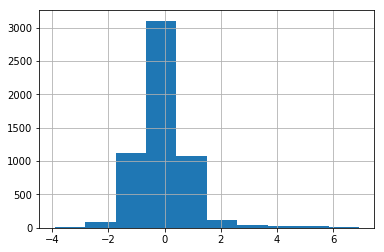

In [10]:
pd.Series(im_band1_rot.flatten()).hist()

# PCA

In [11]:
# Create Data
X, y = [], []
for im_band1, im_band2, label in zip(df['band_1'], df['band_2'], df['is_iceberg']):
    X.append(im_band1 + im_band2)
    y.append(label)    
X = np.array(X)
y = np.array(y)
print 'X.shape:', X.shape
print 'y.shape:', y.shape

X.shape: (1604, 11250)
y.shape: (1604,)


X_pca.shape: (1604, 3)


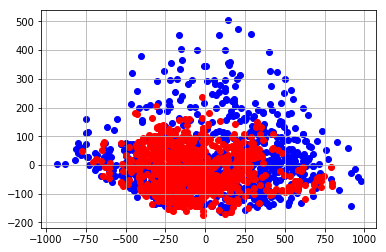

In [12]:
# PCA
pca_model = PCA(n_components=3)
X_pca = pca_model.fit_transform(X)
print 'X_pca.shape:', X_pca.shape
# Plot PCA
fig = plt.figure()
labels = [0, 1]
colors = ['b', 'r']
for label, color in zip(labels, colors):
    X_ = X_pca[y == label]
    plt.scatter(X_[:, 0], X_[:, 1], color=color)
plt.grid('on')

# FFT

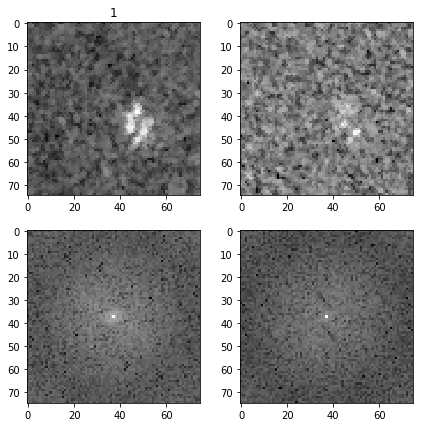

In [13]:
i = 500
im_band1 = np.array(df.iloc[i]['band_1']).reshape(75, 75)
im_band2 = np.array(df.iloc[i]['band_2']).reshape(75, 75)
im_band1_fft = fftpack.fftshift(np.log(np.abs(fftpack.fft2(im_band1))))
im_band2_fft = fftpack.fftshift(np.log(np.abs(fftpack.fft2(im_band2))))
label = df.iloc[i]['is_iceberg']
#
fig = plt.figure(figsize=(7, 7))
plt.subplot(2,2,1); plt.imshow(im_band1, cmap='gray'); plt.title(label)
plt.subplot(2,2,2); plt.imshow(im_band2, cmap='gray')
plt.subplot(2,2,3); plt.imshow(im_band1_fft, cmap='gray')
plt.subplot(2,2,4); plt.imshow(im_band2_fft, cmap='gray')

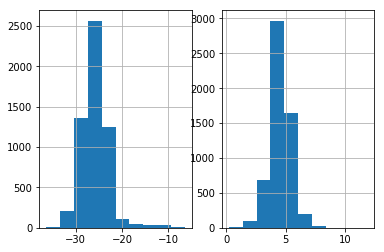

In [14]:
plt.subplot(1,2,1)
pd.Series(im_band1.flatten()).hist()

plt.subplot(1,2,2)
pd.Series(im_band1_fft.flatten()).hist()

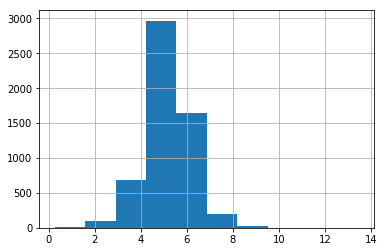

In [15]:
im_band1_fft_n = im_band1_fft.flatten() / np.std(im_band1_fft)
pd.Series(im_band1_fft_n).hist()

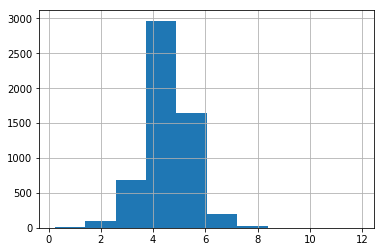

In [16]:
pd.Series(im_band1_fft.flatten()).hist()

# Statistical Exploration

In [17]:
df

,band_1,band_2,id,inc_angle,is_iceberg
0,"[-27.878361, -27.15416, -28.668615, -29.537971...","[-27.154118, -29.537888, -31.0306, -32.190483,...",dfd5f913,43.9239,0
1,"[-12.242375, -14.920305, -14.920363, -12.66633...","[-31.506321, -27.984554, -26.645678, -23.76760...",e25388fd,38.1562,0
2,"[-24.603676, -24.603714, -24.871029, -23.15277...","[-24.870956, -24.092632, -20.653963, -19.41104...",58b2aaa0,45.2859,1
3,"[-22.454607, -23.082819, -23.998013, -23.99805...","[-27.889421, -27.519794, -27.165262, -29.10350...",4cfc3a18,43.8306,0
4,"[-26.006956, -23.164886, -23.164886, -26.89116...","[-27.206915, -30.259186, -30.259186, -23.16495...",271f93f4,35.6256,0
5,"[-20.769371, -20.769434, -25.906025, -25.90602...","[-29.288746, -29.712593, -28.884804, -28.88480...",b51d18b5,36.9034,1
6,"[-26.673811, -23.666162, -27.622442, -28.31768...","[-24.557735, -26.97868, -27.622442, -29.073456...",31da1a04,34.4751,1
7,"[-24.989119, -27.755224, -25.817074, -24.98927...","[-27.755173, -26.732174, -28.124943, -31.83772...",56929c16,41.1769,0
8,"[-17.146641, -17.146572, -17.994583, -19.44553...","[-25.733608, -24.472507, -24.710424, -22.77215...",525ab75c,35.7829,0
9,"[-24.020853, -23.551275, -27.18819, -29.126434...","[-28.702518, -33.563324, -29.571918, -29.12643...",192f56eb,43.3007,0


Text(0.5,0.98,u'Minimum')

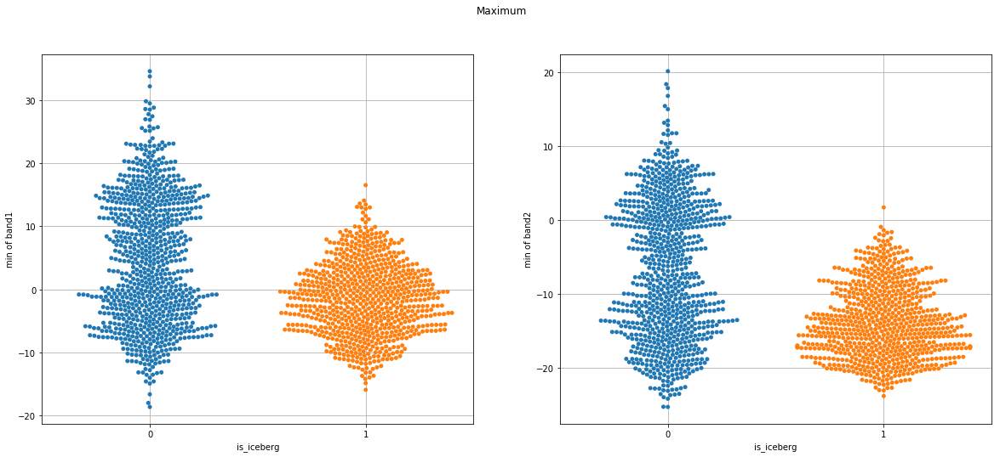

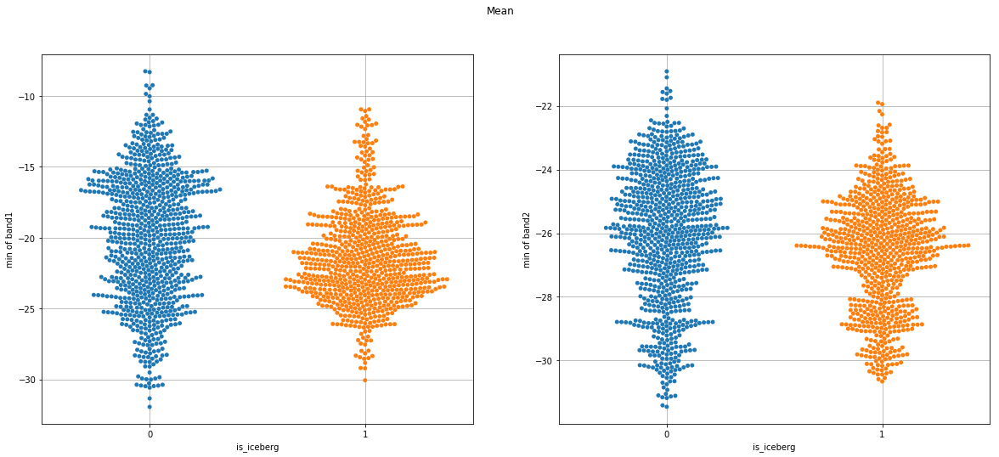

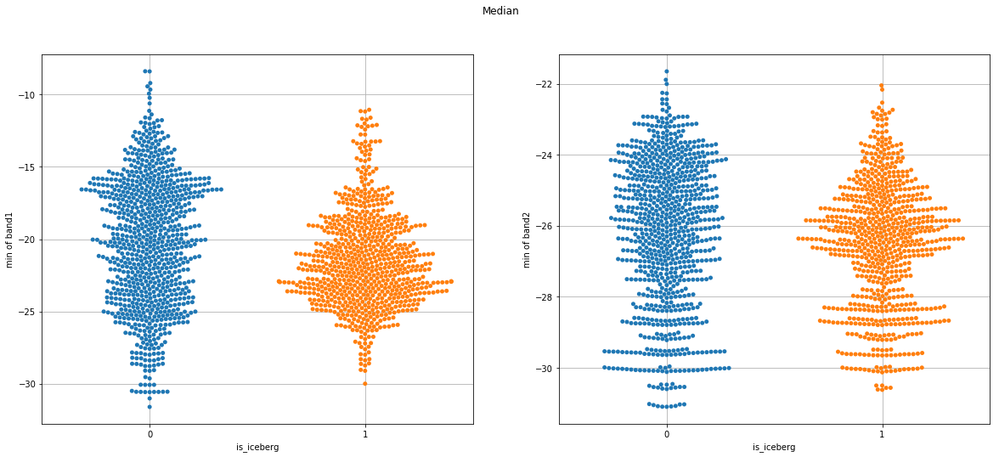

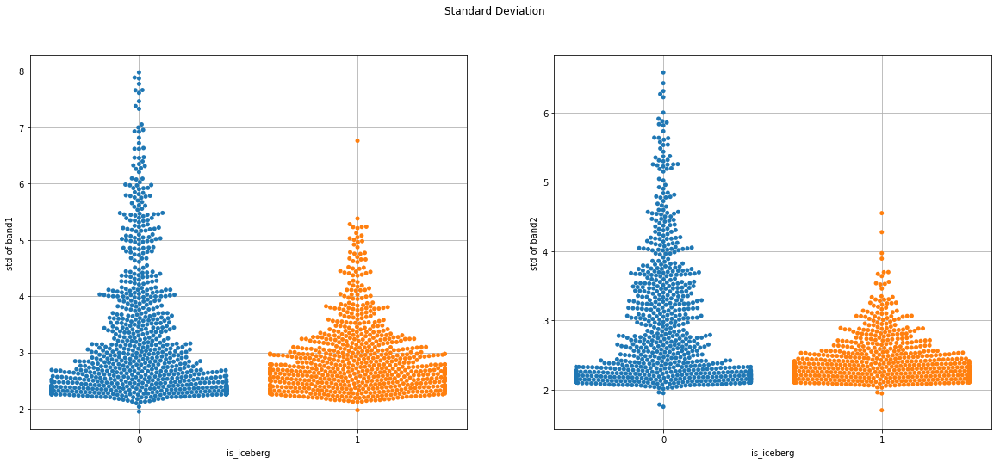

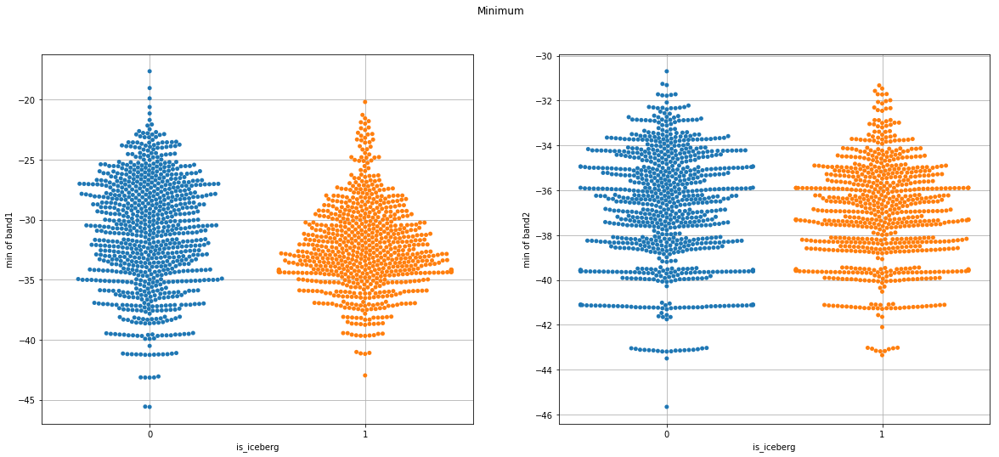

In [18]:
# Maximum
fig = plt.figure(figsize=(20, 8))
plt.subplot(1,2,1); 
sns.swarmplot(y=df['band_1'].apply(lambda x: max(x)), x=df['is_iceberg'])
plt.ylabel('min of band1')
plt.grid('on');
plt.subplot(1,2,2);
sns.swarmplot(y=df['band_2'].apply(lambda x: max(x)), x=df['is_iceberg'])
plt.ylabel('min of band2')
plt.grid('on');
plt.suptitle('Maximum')

# Mean
fig = plt.figure(figsize=(20, 8))
plt.subplot(1,2,1); 
sns.swarmplot(y=df['band_1'].apply(lambda x: np.mean(x)), x=df['is_iceberg'])
plt.ylabel('min of band1')
plt.grid('on');
plt.subplot(1,2,2);
sns.swarmplot(y=df['band_2'].apply(lambda x: np.mean(x)), x=df['is_iceberg'])
plt.ylabel('min of band2')
plt.grid('on');
plt.suptitle('Mean')

# Median
fig = plt.figure(figsize=(20, 8))
plt.subplot(1,2,1); 
sns.swarmplot(y=df['band_1'].apply(lambda x: np.median(x)), x=df['is_iceberg'])
plt.ylabel('min of band1')
plt.grid('on');
plt.subplot(1,2,2);
sns.swarmplot(y=df['band_2'].apply(lambda x: np.median(x)), x=df['is_iceberg'])
plt.ylabel('min of band2')
plt.grid('on');
plt.suptitle('Median')

# Standard deviation
fig = plt.figure(figsize=(20, 8))
plt.subplot(1,2,1); 
sns.swarmplot(y=df['band_1'].apply(lambda x: np.std(x)), x=df['is_iceberg'])
plt.ylabel('std of band1')
plt.grid('on');
plt.subplot(1,2,2);
sns.swarmplot(y=df['band_2'].apply(lambda x: np.std(x)), x=df['is_iceberg'])
plt.ylabel('std of band2')
plt.grid('on');
plt.suptitle('Standard Deviation')

# Minimum
fig = plt.figure(figsize=(20, 8))
plt.subplot(1,2,1); 
sns.swarmplot(y=df['band_1'].apply(lambda x: min(x)), x=df['is_iceberg'])
plt.ylabel('min of band1')
plt.grid('on');
plt.subplot(1,2,2);
sns.swarmplot(y=df['band_2'].apply(lambda x: min(x)), x=df['is_iceberg'])
plt.ylabel('min of band2')
plt.grid('on');
plt.suptitle('Minimum')

# Inc Angle

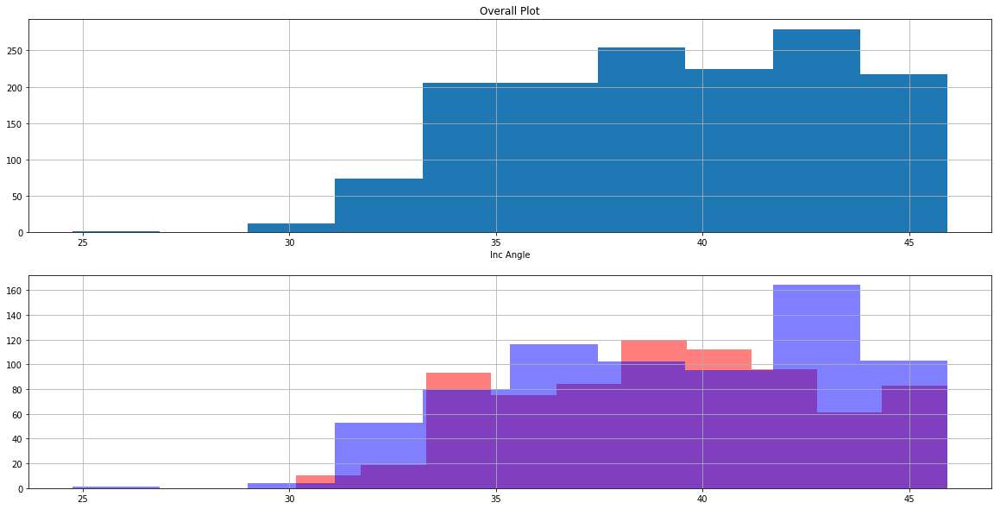

In [39]:
# Training set
inc_angle_data = pd.to_numeric(df[df['inc_angle'] != 'na']['inc_angle'])
inc_angle_data_iceberg = pd.to_numeric(df[(df['inc_angle'] != 'na') & (df['is_iceberg'] == 1)]['inc_angle'])
inc_angle_data_not_iceberg = pd.to_numeric(df[(df['inc_angle'] != 'na') & (df['is_iceberg'] == 0)]['inc_angle'])

# Plot
fig = plt.figure(figsize=(20, 10))
# Overall plot
plt.subplot(2,1,1);
inc_angle_data.hist(); plt.title('Overall Plot'); plt.xlabel('Inc Angle')
# Iceberg and NotIceberg
plt.subplot(2,1,2);
inc_angle_data_iceberg.hist(color='r', alpha=0.5);
inc_angle_data_not_iceberg.hist(color='b', alpha=0.5);

In [40]:
# Test Set
df_test = pd.read_json('./data/test.json')
df_test

,band_1,band_2,id,inc_angle
0,"[-15.863251, -15.201077, -17.887735, -19.17248...","[-21.629612, -21.142353, -23.908337, -28.34524...",5941774d,34.966400
1,"[-26.0589694977, -26.0589694977, -26.058969497...","[-25.7542076111, -25.7542076111, -25.754207611...",4023181e,32.615072
2,"[-14.1410999298, -15.0642414093, -17.375520706...","[-14.745639801, -14.5904102325, -14.3626976013...",b20200e4,37.505433
3,"[-12.167478, -13.706167, -16.54837, -13.572674...","[-24.32222, -26.375538, -24.096739, -23.8769, ...",e7f018bb,34.473900
4,"[-23.3745937347, -26.0271816254, -28.121963501...","[-25.7223434448, -27.0115776062, -23.149162292...",4371c8c3,43.918874
5,"[-18.1353492737, -18.1353492737, -18.135349273...","[-14.6503257751, -14.6503257751, -14.650325775...",a8d9b1fd,35.933020
6,"[-24.565174, -26.567524, -25.946882, -26.89542...","[-32.915886, -35.194798, -32.272282, -28.7505,...",29e7727e,42.414200
7,"[-20.162964, -18.16898, -17.023144, -17.023216...","[-30.905346, -28.406647, -25.381365, -28.77645...",92a51ffb,33.638300
8,"[-21.920645, -21.737827, -21.383303, -21.73792...","[-25.53537, -28.514198, -27.75848, -31.280354,...",c769ac97,41.107600
9,"[-14.811565, -16.318594, -17.082613, -16.41037...","[-22.617977, -21.065811, -27.914198, -25.24334...",aee0547d,34.966400


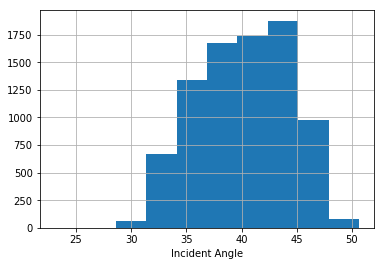

In [42]:
# Test Data
fig = plt.figure()
df_test['inc_angle'].hist()
plt.xlabel('Incident Angle');

## Visualize Images in the Test Set According to Precision

In [68]:
# Visualize images in the test set according to precision
df_test['inc_angle'].apply(lambda x: len(str(x))).value_counts().sort_index()

4        1
5       20
6      316
7     3088
10       5
11      48
12     441
13    4505
Name: inc_angle, dtype: int64

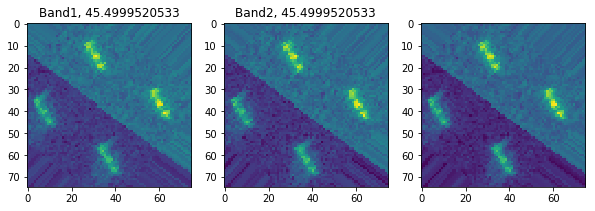

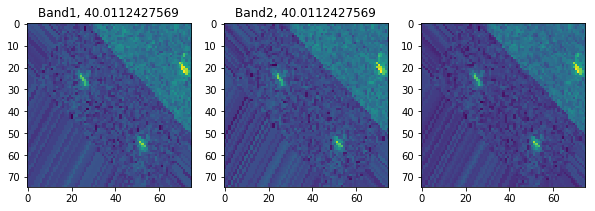

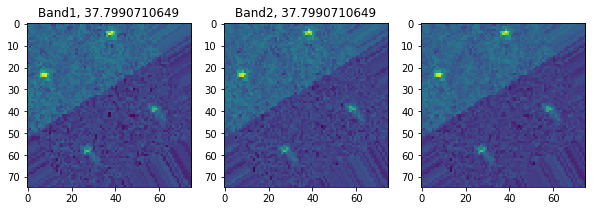

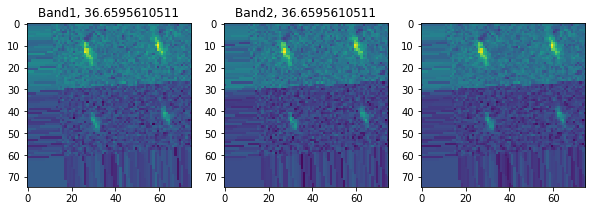

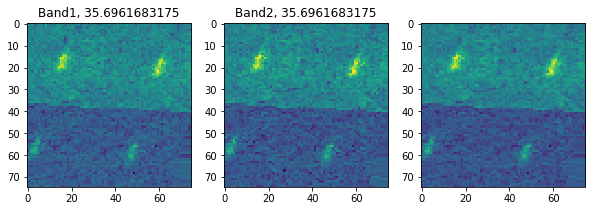

...

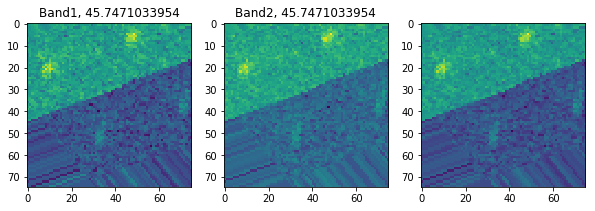

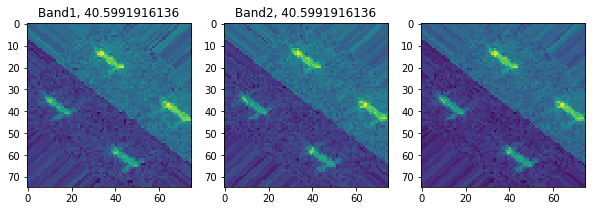

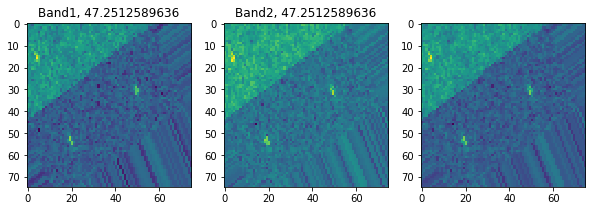

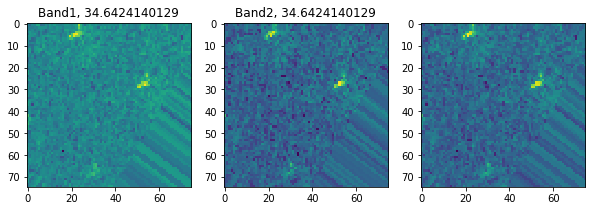

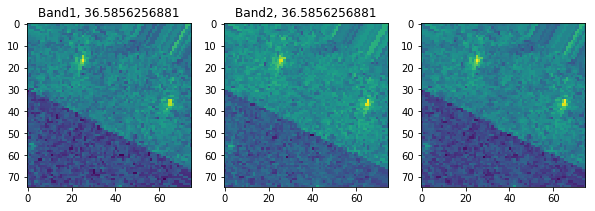

In [65]:
# Visualize images with precision >7 (Machine Generated Images)
df_ = df_test[df_test['inc_angle'].apply(lambda x: len(str(x))) > 7].sample(n=25)                             
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
    plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);

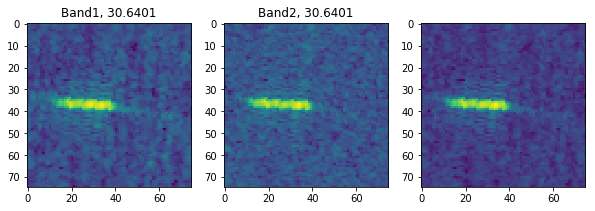

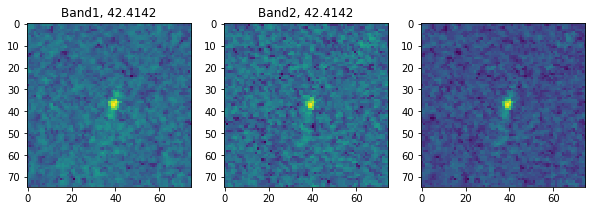

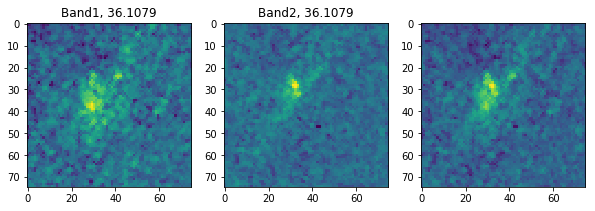

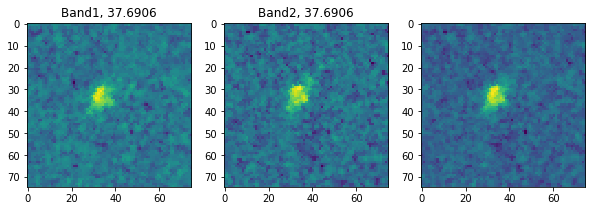

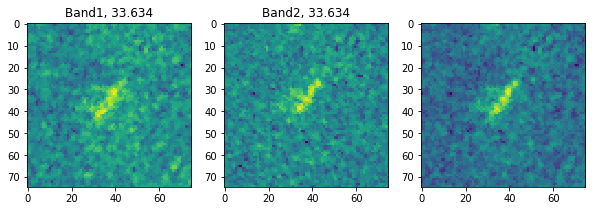

...

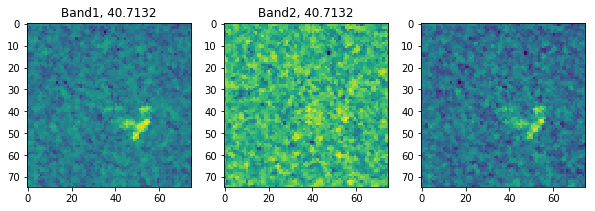

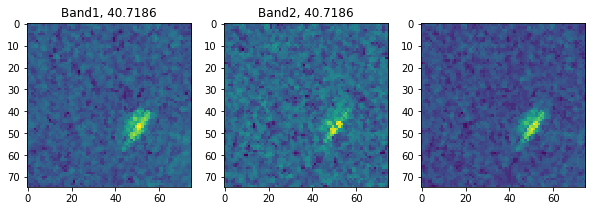

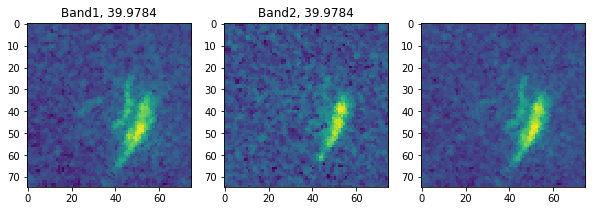

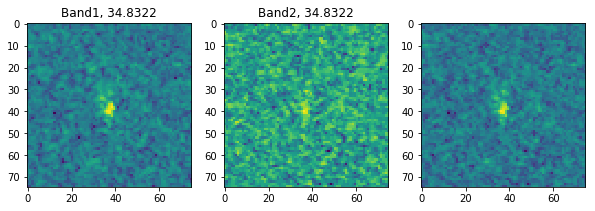

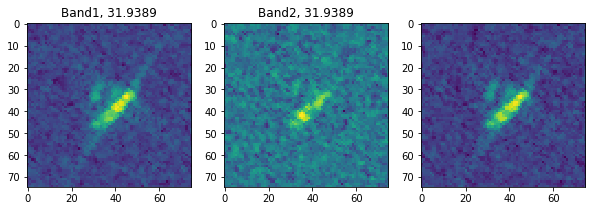

In [66]:
# Visualize images with precision <7 (Not Machine Generated Images)
df_ = df_test[df_test['inc_angle'].apply(lambda x: len(str(x))) <= 7].sample(n=25)                             
for im_band1, im_band2, angle in zip(df_['band_1'], df_['band_2'], df_['inc_angle']):    
    im_band1 = np.array(im_band1).reshape(75, 75)
    im_band2 = np.array(im_band2).reshape(75, 75)
    # Plot
    fig = plt.figure(figsize=(10, 6))
    plt.subplot(1,3,1); plt.imshow(im_band1); plt.title('Band1, ' + str(angle))
    plt.subplot(1,3,2); plt.imshow(im_band2); plt.title('Band2, ' + str(angle))
    plt.subplot(1,3,3); plt.imshow((im_band1 + im_band2) / 2.0);

In [79]:
(df_test['inc_angle'].apply(lambda x: len(str(x))) <= 7).sum()

3425

In [78]:
len(df_test)

8424

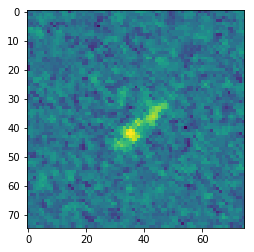

In [81]:
return scipy.signal.fftconvolve(im1_gray, im2_gray[::-1,::-1], mode='same')

In [86]:
im_band1_mean = im_band1 - np.mean(im_band1)
im_band2_mean = im_band2 - np.mean(im_band2)
im_convolve = fftconvolve(im_band1_mean, im_band2_mean[::-1,::-1], mode='same')

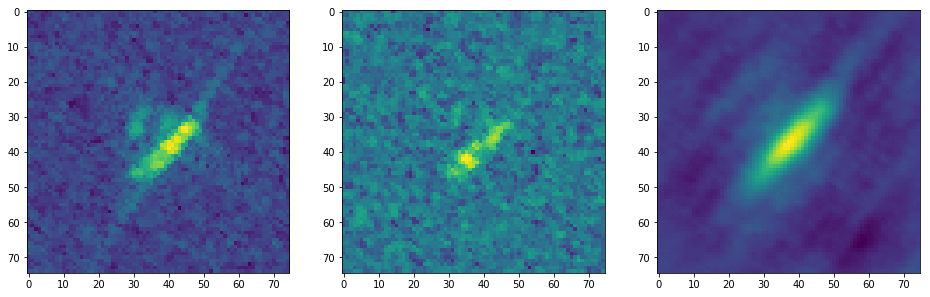

In [91]:
fig = plt.figure(figsize=(16, 7))
plt.subplot(1,3,1); plt.imshow(im_band1_mean)
plt.subplot(1,3,2); plt.imshow(im_band2_mean)
plt.subplot(1,3,3); plt.imshow(im_convolve)